## Import Libraries

In [6]:
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import seaborn as sns
import cv2
from google.colab.patches import cv2_imshow
import matplotlib.patches as patches
import warnings
warnings.filterwarnings("ignore")

## Download Annotations and sample image from google drive

In [7]:
!gdown --id '1ai51jSsnaR1nEEw_QoDn4Wpf9Bt3u7mL'

Downloading...
From: https://drive.google.com/uc?id=1ai51jSsnaR1nEEw_QoDn4Wpf9Bt3u7mL
To: /content/yolov5/WebMarket_coco_gt_object.csv
100% 4.32M/4.32M [00:00<00:00, 28.0MB/s]


In [8]:
!gdown --id '1Yy0Vxs8aaYvZingKaX5Mf6tpTYQB9gYg'

Downloading...
From: https://drive.google.com/uc?id=1Yy0Vxs8aaYvZingKaX5Mf6tpTYQB9gYg
To: /content/yolov5/db1.jpg
100% 722k/722k [00:00<00:00, 91.0MB/s]


## Read the bounding boxes

In [9]:
bounding_box = pd.read_csv('WebMarket_coco_gt_object.csv')

## Display sample image

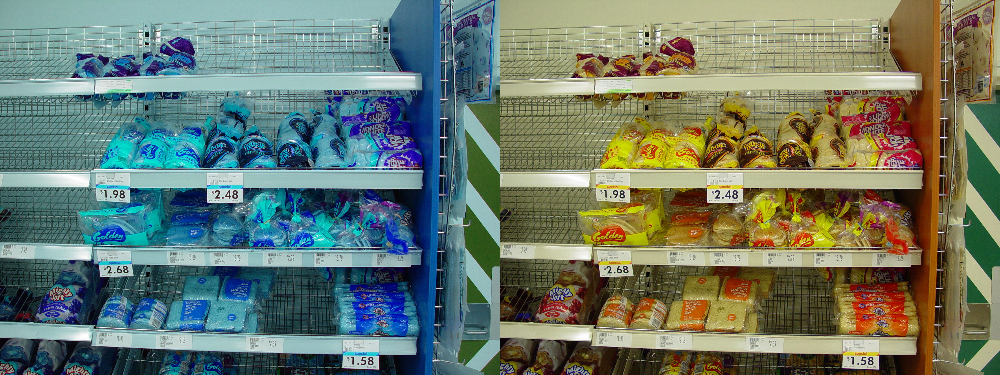

In [10]:
  from skimage import io
  
  image = io.imread('db1.jpg') 
  image_2 = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
  final_frame = cv2.hconcat((image, image_2))
  cv2_imshow(final_frame)
  print('\n')

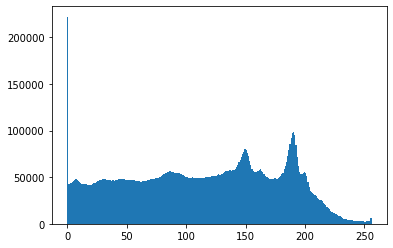

In [11]:
plt.hist(image.ravel(),bins = 256, range = [0,256]) 
plt.show()

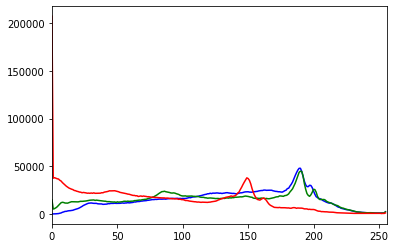

In [12]:
color = ('b','g','r')
for i,col in enumerate(color):
    histr = cv2.calcHist([image],[i],None,[256],[0,256])
    plt.plot(histr,color = col)
    plt.xlim([0,256])
plt.show()

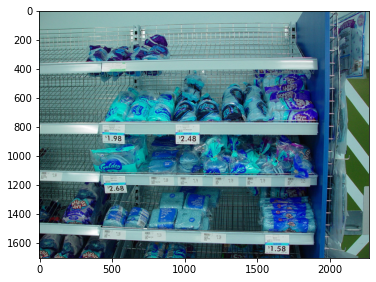

In [13]:
fig = plt.figure(figsize=(10,10))
file_name = 'db' + str(1) + '.jpg'
ax1 = plt.subplot(2,1,1) 
# Display the image
img = cv2.imread(file_name)

ax1.imshow(img)
plt.show()

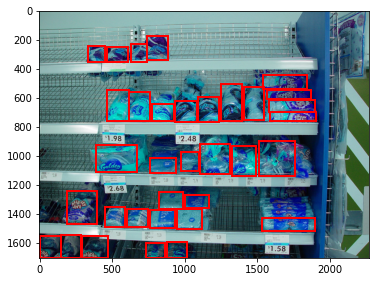

In [14]:
fig = plt.figure(figsize=(10,10))
file_name = 'db' + str(1) + '.jpg'
ax1 = plt.subplot(2,1,1) 
# Display the image
img = cv2.imread(file_name)

ax1.imshow(img)

for i in range(bounding_box[bounding_box['image_name'] == file_name].shape[0]):
    x1 = bounding_box[bounding_box['image_name'] == file_name].iloc[i]['x1']
    y1 = bounding_box[bounding_box['image_name'] == file_name].iloc[i]['y1']
    x2 = bounding_box[bounding_box['image_name'] == file_name].iloc[i]['x2']
    y2 = bounding_box[bounding_box['image_name'] == file_name].iloc[i]['y2']

    # Create a Rectangle patch
    rect = patches.Rectangle((x1, y1), x2 - x1, y2 - y1, linewidth=2, edgecolor='r', facecolor='none')

    # Add the patch to the Axes
    ax1.add_patch(rect)
plt.show()

## Get the height and width of the images

In [15]:
img.shape

(1704, 2272, 3)

In [16]:
bounding_box.shape

(118388, 6)

## Set the height and width

In [17]:
# bounding_box['Folder'] = bounding_box['image_name'].apply(lambda s : s.split('.')[0][2:])
bounding_box["width"]= img.shape[1]
bounding_box["height"] = img.shape[0]

In [18]:
# Add new column names to dataset
bounding_box.columns = ['filename','xmin', 'ymin', 'xmax', 'ymax', 'class', 'width', 'height']

In [19]:
bounding_box.head()

,filename,xmin,ymin,xmax,ymax,class,width,height
0,db1.jpg,1105,919,1315,1127,object,2272,1704
1,db1.jpg,191,1242,398,1469,object,2272,1704
2,db1.jpg,1587,697,1906,761,object,2272,1704
3,db1.jpg,1541,442,1845,541,object,2272,1704
4,db1.jpg,1252,505,1398,761,object,2272,1704


## Check for Null values

In [20]:
bounding_box.isnull().sum()

filename    0
xmin        0
ymin        0
xmax        0
ymax        0
class       0
width       0
height      0
dtype: int64

## Get the count of bounding boxes per images

In [21]:
count_of_bounding_box = bounding_box.groupby('filename')['class'].count().to_frame().sort_values(by = 'class', ascending = False)
count_of_bounding_box

,class
filename,
db1849.jpg,264
db98.jpg,230
db89.jpg,199
db1850.jpg,192
db92.jpg,180
...,...
db2066.jpg,2
db3048.jpg,2
db412.jpg,2


In [22]:
count_of_bounding_box['class'].median()

34.0

In [23]:
bounding_box.describe()

,xmin,ymin,xmax,ymax,width,height
count,118388.000000,118388.000000,118388.000000,118388.000000,118388.0,118388.0
mean,1107.766193,800.017797,1304.852747,1061.759756,2272.0,1704.0
std,688.966120,508.107534,689.925745,501.567340,0.0,0.0
min,0.000000,0.000000,0.000000,6.000000,2272.0,1704.0
25%,511.000000,346.000000,713.000000,641.000000,2272.0,1704.0
50%,1098.000000,807.000000,1303.000000,1072.000000,2272.0,1704.0
75%,1687.000000,1236.000000,1887.000000,1501.000000,2272.0,1704.0
max,2590.000000,1969.000000,2639.000000,2260.000000,2272.0,1704.0


In [24]:
bounding_box[bounding_box['xmax'] == 0]

,filename,xmin,ymin,xmax,ymax,class,width,height
96842,db2114.jpg,1,723,0,723,object,2272,1704


## Plot the bounding boxes to understand the data

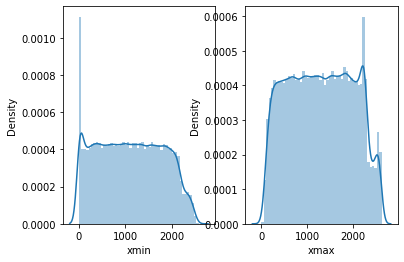

In [25]:

plt.subplot(1, 2, 1)
sns.distplot(bounding_box['xmin'])
plt.subplot(1, 2, 2)
sns.distplot(bounding_box['xmax'])
plt.show()


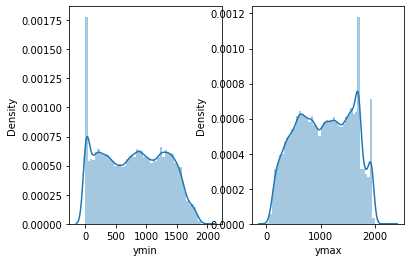

In [26]:

plt.subplot(1, 2, 1)
sns.distplot(bounding_box['ymin'])
plt.subplot(1, 2, 2)
sns.distplot(bounding_box['ymax'])
plt.show()


## Check if there is any data with both min and max value same or min value is greater than max (Both is not valid)

In [27]:
bounding_box[bounding_box['xmin'] >= bounding_box['xmax']]


,filename,xmin,ymin,xmax,ymax,class,width,height
1262,db121.jpg,538,1600,538,1600,object,2272,1704
4257,db18.jpg,968,1082,968,1082,object,2272,1704
7373,db261.jpg,1595,1121,1595,1121,object,2272,1704
7375,db261.jpg,1895,1128,1895,1128,object,2272,1704
7854,db276.jpg,1218,1267,1218,1267,object,2272,1704
...,...,...,...,...,...,...,...,...
111748,db2496.jpg,1940,1210,1940,1210,object,2272,1704
111834,db2499.jpg,1724,6,1724,6,object,2272,1704
112432,db2528.jpg,870,1381,870,1381,object,2272,1704
113891,db2575.jpg,1260,1098,1260,1098,object,2272,1704


In [28]:
bounding_box[bounding_box['ymin'] >= bounding_box['ymax']]

,filename,xmin,ymin,xmax,ymax,class,width,height
1262,db121.jpg,538,1600,538,1600,object,2272,1704
4257,db18.jpg,968,1082,968,1082,object,2272,1704
7373,db261.jpg,1595,1121,1595,1121,object,2272,1704
7375,db261.jpg,1895,1128,1895,1128,object,2272,1704
7854,db276.jpg,1218,1267,1218,1267,object,2272,1704
...,...,...,...,...,...,...,...,...
111748,db2496.jpg,1940,1210,1940,1210,object,2272,1704
111834,db2499.jpg,1724,6,1724,6,object,2272,1704
112432,db2528.jpg,870,1381,870,1381,object,2272,1704
113891,db2575.jpg,1260,1098,1260,1098,object,2272,1704


## The above bounding boxes can be deleted as this is not valid bounding box

In [29]:
bounding_box.drop(bounding_box[bounding_box['xmin'] >= bounding_box['xmax']].index, axis = 0, inplace = True)
bounding_box.drop(bounding_box[bounding_box['ymin'] >= bounding_box['ymax']].index, axis = 0, inplace = True)

## Find if there is any image without bounding box

In [30]:
bounding_box['filenumbers'] = bounding_box['filename'].apply(lambda x: x.split('.')[0][2:]).astype(int)

In [31]:
unique_numbers = bounding_box['filenumbers'].unique()
for i in range(1, 3154):
  if i not in unique_numbers:
    print(i)

2444
3044


## There are 2 files without bounding boxes (db2044.jpg and db3044.jpg) and can be deleted

In [32]:
bounding_box.to_csv('Annotations.csv', index=False)

## Clone Yolov5

In [53]:
!git clone https://github.com/ultralytics/yolov5
!pip install -qr yolov5/requirements.txt
%cd yolov5

import torch
from IPython.display import Image, clear_output
# from utils.google_utils import gdrive_download

clear_output()

## Download Dataset which is already uploaded in Roboflow

In [54]:
%cd /content

# !curl -L "https://app.roboflow.com/ds/vOd4v6cduB?key=WdWHSPaXpS" > roboflow.zip; unzip roboflow.zip; rm roboflow.zip ## Full data 

!curl -L "https://app.roboflow.com/ds/QsiWjD9tDP?key=2RozUgzcz2" > roboflow.zip; unzip roboflow.zip; rm roboflow.zip ## db1 data

/content
  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100   888  100   888    0     0   1812      0 --:--:-- --:--:-- --:--:--  1812
100 30.7M  100 30.7M    0     0  40.2M      0 --:--:-- --:--:-- --:--:--  114M
Archive:  roboflow.zip
replace README.dataset.txt? [y]es, [n]o, [A]ll, [N]one, [r]ename: A
 extracting: README.dataset.txt      
 extracting: README.roboflow.txt     
 extracting: data.yaml               
 extracting: test/images/db112_jpg.rf.2c2812197dc2f2b53ea38ae483408a14.jpg  
 extracting: test/images/db136_jpg.rf.18189504fca700b0ea0deb9e06f25015.jpg  
 extracting: test/images/db146_jpg.rf.049993b982a57b7c238e09ab34d0f7cc.jpg  
 extracting: test/images/db155_jpg.rf.52475d5ebbfaf401ac2b6253647580da.jpg  
 extracting: test/images/db161_jpg.rf.9bfc6209e8dee319689d569b080c1a2a.jpg  
 extracting: test/images/db165_jpg.rf.ca2cde2fdb4b341c109f5c7ff67c53b2.jpg  
 extract

## Look through the data.yaml file

In [55]:
#extracting information from the roboflow file
%cat data.yaml

train: ../train/images
val: ../valid/images

nc: 1
names: ['object']

## Look into yolov5s model

In [56]:
%cat /content/yolov5/models/yolov5s.yaml

# YOLOv5 🚀 by Ultralytics, GPL-3.0 license

# Parameters
nc: 80  # number of classes
depth_multiple: 0.33  # model depth multiple
width_multiple: 0.50  # layer channel multiple
anchors:
  - [10,13, 16,30, 33,23]  # P3/8
  - [30,61, 62,45, 59,119]  # P4/16
  - [116,90, 156,198, 373,326]  # P5/32

# YOLOv5 v6.0 backbone
backbone:
  # [from, number, module, args]
  [[-1, 1, Conv, [64, 6, 2, 2]],  # 0-P1/2
   [-1, 1, Conv, [128, 3, 2]],  # 1-P2/4
   [-1, 3, C3, [128]],
   [-1, 1, Conv, [256, 3, 2]],  # 3-P3/8
   [-1, 6, C3, [256]],
   [-1, 1, Conv, [512, 3, 2]],  # 5-P4/16
   [-1, 9, C3, [512]],
   [-1, 1, Conv, [1024, 3, 2]],  # 7-P5/32
   [-1, 3, C3, [1024]],
   [-1, 1, SPPF, [1024, 5]],  # 9
  ]

# YOLOv5 v6.0 head
head:
  [[-1, 1, Conv, [512, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 6], 1, Concat, [1]],  # cat backbone P4
   [-1, 3, C3, [512, False]],  # 13

   [-1, 1, Conv, [256, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 4], 1, Concat, [1]]

## Train the model for 100 Epochs

In [33]:
# train yolov5s on custom data for 100 epochs
# time its performance
%%time
%cd /content/yolov5/
!python train.py --img 416 --batch 16 --epochs 100 --data '../data.yaml' --cfg ./models/yolov5s.yaml --weights '' --name yolov5s_results  --cache

/content/yolov5
train: weights=, cfg=./models/yolov5s.yaml, data=../data.yaml, hyp=data/hyps/hyp.scratch.yaml, epochs=100, batch_size=16, imgsz=416, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, evolve=None, bucket=, cache=ram, image_weights=False, device=, multi_scale=False, single_cls=False, optimizer=SGD, sync_bn=False, workers=8, project=runs/train, name=yolov5s_results, exist_ok=False, quad=False, linear_lr=False, label_smoothing=0.0, patience=100, freeze=[0], save_period=-1, local_rank=-1, entity=None, upload_dataset=False, bbox_interval=-1, artifact_alias=latest
github: up to date with https://github.com/ultralytics/yolov5 ✅
YOLOv5 🚀 v6.0-253-ga45e472 torch 1.10.0+cu111 CUDA:0 (Tesla K80, 11441MiB)

hyperparameters: lr0=0.01, lrf=0.1, momentum=0.937, weight_decay=0.0005, warmup_epochs=3.0, warmup_momentum=0.8, warmup_bias_lr=0.1, box=0.05, cls=0.5, cls_pw=1.0, obj=1.0, obj_pw=1.0, iou_t=0.2, anchor_t=4.0, fl_gamma=0.0, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4

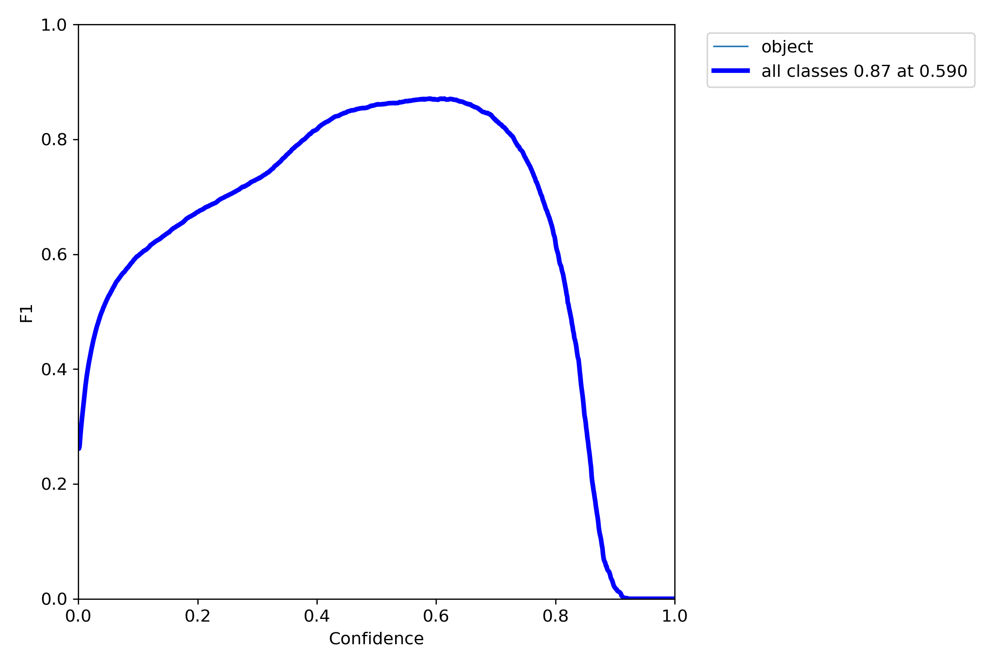

In [57]:
display(Image(filename='/content/yolov5/runs/train/yolov5s_results2/F1_curve.png'))

## 

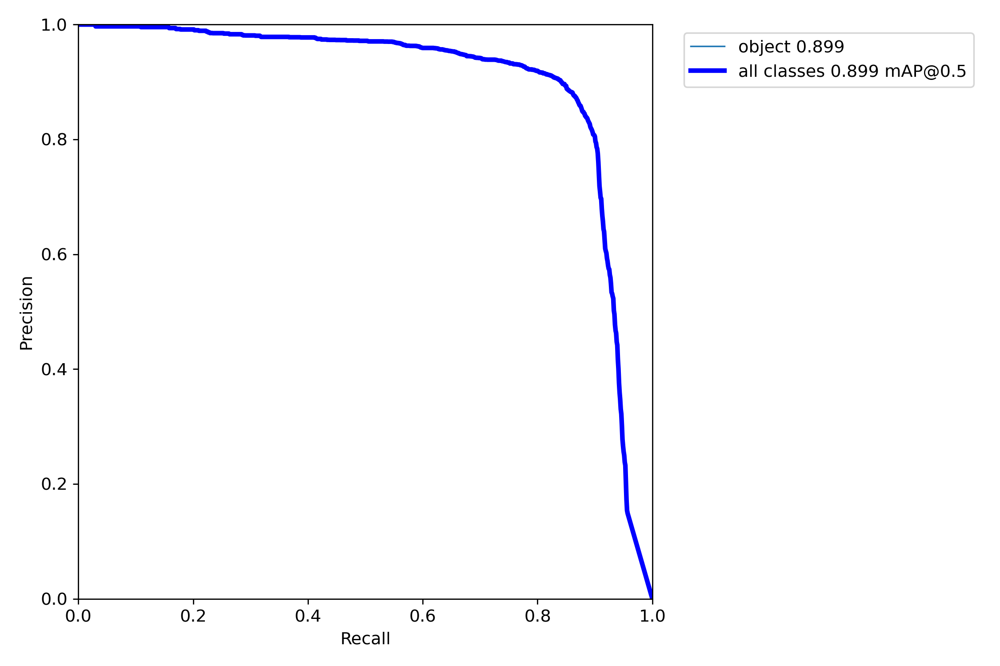

In [58]:
display(Image(filename='/content/yolov5/runs/train/yolov5s_results2/PR_curve.png'))

## Compare val results

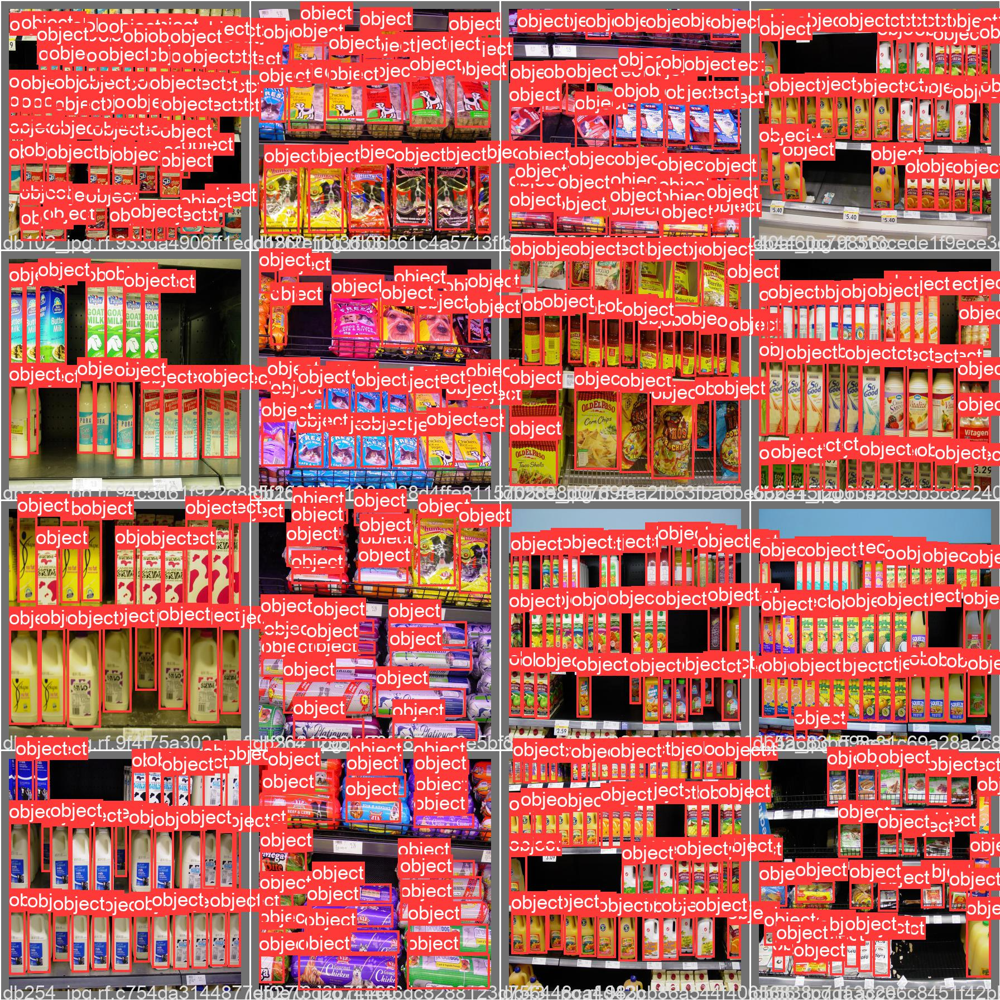

In [59]:
display(Image('/content/yolov5/runs/train/yolov5s_results2/val_batch0_labels.jpg'))



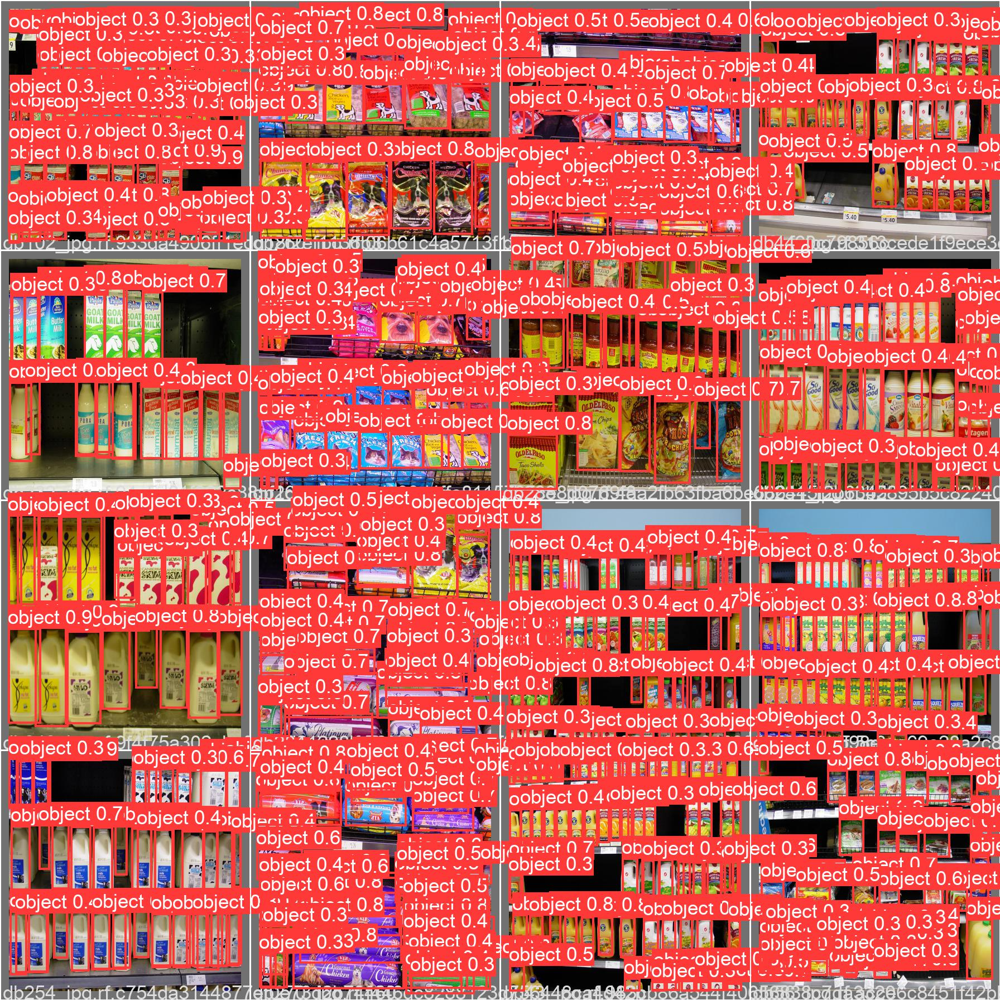

In [60]:
display(Image('/content/yolov5/runs/train/yolov5s_results2/val_batch0_pred.jpg'))

## Run it on Test images

In [35]:
!python detect.py --weights runs/train/yolov5s_results2/weights/best.pt --img 416 --conf 0.4 --source ../test/images

detect: weights=['runs/train/yolov5s_results2/weights/best.pt'], source=../test/images, data=data/coco128.yaml, imgsz=[416, 416], conf_thres=0.4, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False
YOLOv5 🚀 v6.0-253-ga45e472 torch 1.10.0+cu111 CUDA:0 (Tesla K80, 11441MiB)

Fusing layers... 
Model Summary: 213 layers, 7012822 parameters, 0 gradients, 15.8 GFLOPs
image 1/30 /content/test/images/db112_jpg.rf.2c2812197dc2f2b53ea38ae483408a14.jpg: 416x416 32 objects, Done. (0.025s)
image 2/30 /content/test/images/db136_jpg.rf.18189504fca700b0ea0deb9e06f25015.jpg: 416x416 50 objects, Done. (0.025s)
image 3/30 /content/test/images/db146_jpg.rf.049993b982a57b7c238e09ab34d0f7cc.jpg: 416x416 89 objects, Done. (0.025s)
image 4/30 /

In [61]:
result_csv = pd.read_csv('/content/yolov5/runs/train/yolov5s_results2/results.csv')

In [62]:
result_csv

,epoch,train/box_loss,train/obj_loss,train/cls_loss,metrics/precision,metrics/recall,metrics/mAP_0.5,metrics/mAP_0.5:0.95,val/box_loss,val/obj_loss,val/cls_loss,x/lr0,x/lr1,x/lr2
0,0,0.105370,0.32632,0,0.032568,0.13434,0.016082,0.003508,0.094904,0.24116,0,0.000390,0.000390,0.096490
1,1,0.099149,0.30767,0,0.029677,0.12241,0.016114,0.003310,0.093879,0.24584,0,0.000790,0.000790,0.092890
2,2,0.098618,0.31824,0,0.034293,0.14135,0.018212,0.003814,0.093545,0.24950,0,0.001189,0.001189,0.089289
3,3,0.097656,0.31197,0,0.033737,0.21115,0.022015,0.004701,0.093605,0.24726,0,0.001587,0.001587,0.085687
4,4,0.097111,0.31282,0,0.039379,0.22869,0.025457,0.005172,0.093644,0.24507,0,0.001983,0.001983,0.082083
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
95,95,0.049806,0.20708,0,0.881160,0.85900,0.899440,0.474740,0.047873,0.16377,0,0.001080,0.001080,0.001080
96,96,0.049636,0.21154,0,0.868680,0.86356,0.893670,0.459760,0.048571,0.16420,0,0.001055,0.001055,0.001055
97,97,0.049188,0.20671,0,0.868960,0.86391,0.889620,0.463020,0.048475,0.16466,0,0.001035,0.001035,0.001035
98,98,0.049629,0.21385,0,0.896420,0.84695,0.898680,0.478760,0.047893,0.16352,0,0.001020,0.001020,0.001020


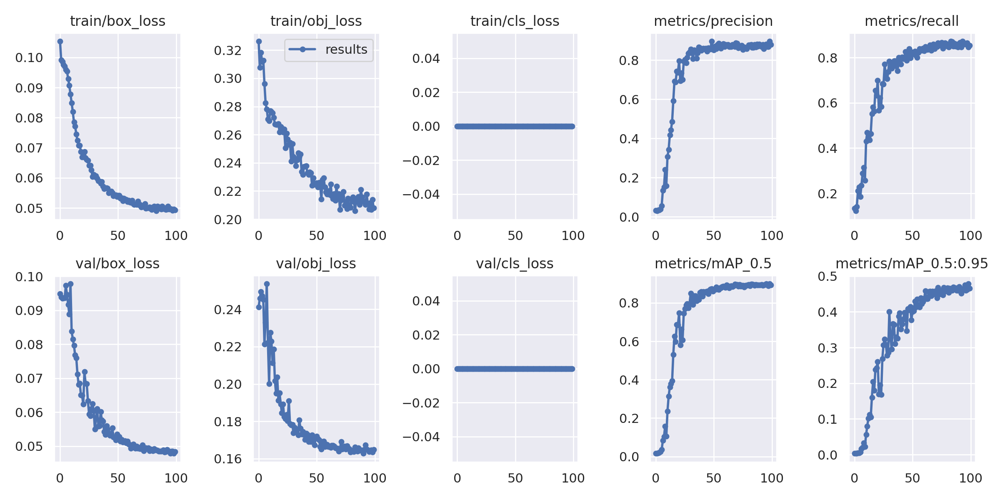

In [63]:
display(Image(filename='/content/yolov5/runs/train/yolov5s_results2/results.png'))

## There is scope of improvement. We can train for all 3000+ images and compare the results

## Display the test images

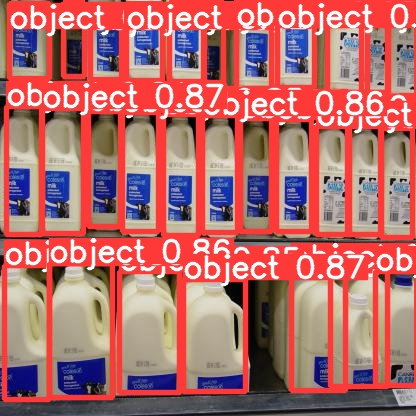

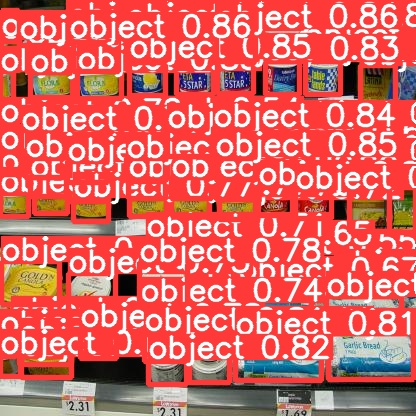

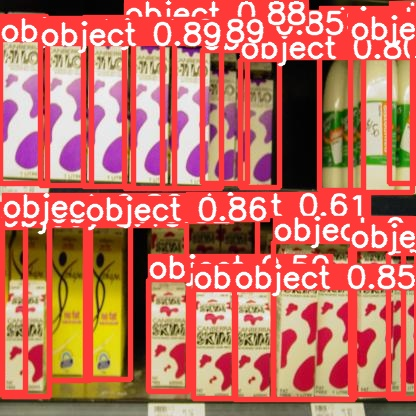

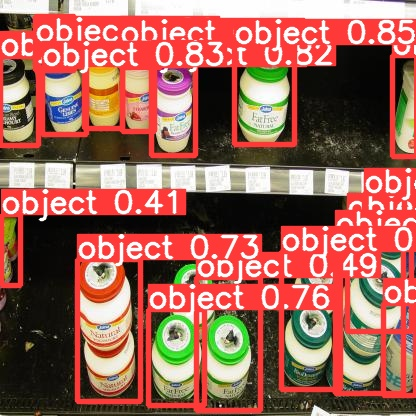

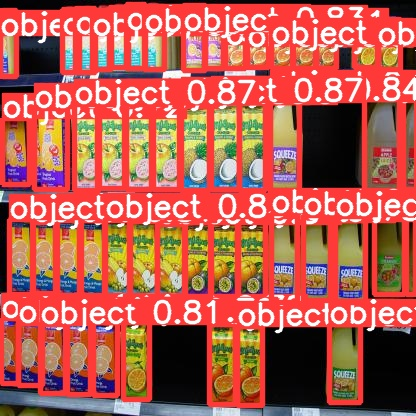

In [37]:
import glob
from IPython.display import Image, display

for imageName in glob.glob('runs/detect/exp/*.jpg')[-5:]:
    display(Image(filename=imageName))
    print("\n")

In [38]:
from google.colab import files
files.download('./runs/train/yolov5s_results2/weights/best.pt')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>